# Image Stitching Using FAST Based Approach 

In [2]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from scipy.signal import convolve2d
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
from time import time
from skimage.feature import plot_matches
from skimage.transform import pyramid_gaussian
from PIL import Image, ImageFilter, ImageDraw

In [3]:
def generate_circle_boundary_indices(radius):
    circle_boundary_idx = []
    for y in range(-radius, radius + 1):
        for x in range(-radius, radius + 1):
            if x**2 + y**2 == radius**2 and (x != 0 or y != 0):
                circle_boundary_idx.append([x, y])
    return np.array(circle_boundary_idx).T

In [4]:
def generate_cross_indices(radius):
    cross_idx = np.array([[radius, 0, -radius, 0], [0, radius, 0, -radius]])
    return cross_idx

In [5]:
cross_idx =  generate_cross_indices(5)
circle_idx = generate_circle_boundary_indices(5)

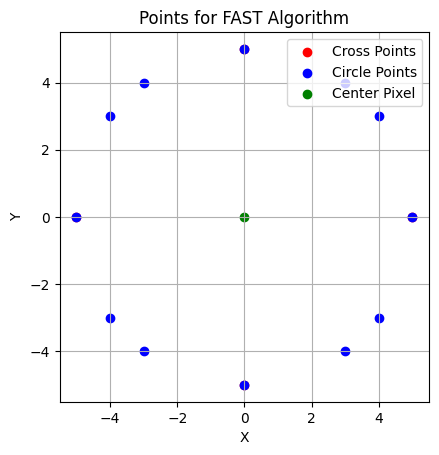

In [6]:
plt.scatter(cross_idx[0], cross_idx[1], color='red', label='Cross Points')
plt.scatter(circle_idx[0], circle_idx[1], color='blue', label='Circle Points')
plt.scatter(0, 0, color='green', label='Center Pixel')

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Points for FAST Algorithm')
plt.grid(True)
plt.gca().set_aspect('equal', adjustable='box')
plt.legend()
plt.show()


In [7]:
def FAST(img, N=10, threshold=0.50, nms_window=3, radius=5):
    kernel = np.array([[1,2,1],
                       [2,4,2],
                       [1,2,1]])/16      # 3x3 Gaussian Window

    img = convolve2d(img, kernel, mode='same')

    # cross_idx = np.array([[3,0,-3,0], [0,3,0,-3]])
    # circle_idx = np.array([[3,3,2,1,0,-1,-2,-3,-3,-3,-2,-1,0,1,2,3],
	  #                      [0,1,2,3,3,3,2,1,0,-1,-2,-3,-3,-3,-2,-1]])
    cross_idx =  generate_cross_indices(5)
    circle_idx = generate_circle_boundary_indices(5)

    corner_img = np.zeros(img.shape)
    keypoints = []
    for y in range(radius, img.shape[0]-radius):
        for x in range(radius, img.shape[1]-radius):
            Ip = img[y,x]
            t = threshold*Ip if threshold < 1 else threshold
            # fast checking cross idx only
            if np.count_nonzero(Ip+t < img[y+cross_idx[0,:], x+cross_idx[1,:]]) >= 3 or np.count_nonzero(Ip-t > img[y+cross_idx[0,:], x+cross_idx[1,:]]) >= 3:
                # detailed check -> full circle
                if np.count_nonzero(img[y+circle_idx[0,:], x+circle_idx[1,:]] >= Ip+t) >= N or np.count_nonzero(img[y+circle_idx[0,:], x+circle_idx[1,:]] <= Ip-t) >= N:
                    # Keypoint [corner]
                    keypoints.append([x,y])     # Note: keypoint = [col, row]
                    corner_img[y,x] = np.sum(np.abs(Ip - img[y+circle_idx[0,:], x+circle_idx[1,:]]))

    # NMS - Non Maximal Suppression
    if nms_window != 0:
        fewer_kps = []
        for [x, y] in keypoints:
            window = corner_img[y-nms_window:y+nms_window+1, x-nms_window:x+nms_window+1]
            # v_max = window.max()
            loc_y_x = np.unravel_index(window.argmax(), window.shape)
            x_new = x + loc_y_x[1] - nms_window
            y_new = y + loc_y_x[0] - nms_window
            new_kp = [x_new, y_new]
            if new_kp not in fewer_kps:
                fewer_kps.append(new_kp)
    else:
        fewer_kps = keypoints

    return np.array(fewer_kps)

In [8]:
def BRIEF(img, keypoints, orientations=None, n=256, patch_size=9, sigma=1, mode='uniform', sample_seed=42):
    random = np.random.RandomState(seed=sample_seed)

    # kernel = np.array([[1,2,1],
    #                    [2,4,2],
    #                    [1,2,1]])/16      # 3x3 Gaussian Window

    kernel = np.array([[1, 4,  7,  4,  1],
                       [4, 16, 26, 16, 4],
                       [7, 26, 41, 26, 7],
                       [4, 16, 26, 16, 4],
                       [1, 4,  7,  4,  1]])/273      # 5x5 Gaussian Window

    img = convolve2d(img, kernel, mode='same')

    if mode == 'normal':
        samples = (patch_size / 5.0) * random.randn(n * 8)
        samples = np.array(samples, dtype=np.int32)
        samples = samples[(samples < (patch_size // 2)) & (samples > - (patch_size - 2) // 2)]
        pos1 = samples[:n * 2].reshape(n, 2)
        pos2 = samples[n * 2:n * 4].reshape(n, 2)
    elif mode == 'uniform':
        samples = random.randint(-(patch_size - 2) // 2 + 1, (patch_size // 2), (n * 2, 2))
        samples = np.array(samples, dtype=np.int32)
        pos1, pos2 = np.split(samples, 2)

    rows, cols = img.shape

    if orientations is None:
        mask = (  ((patch_size // 2 - 1) < keypoints[:, 0])
                & (keypoints[:, 0] < (cols - patch_size // 2 + 1))
                & ((patch_size // 2 - 1) < keypoints[:, 1])
                & (keypoints[:, 1] < (rows - patch_size // 2 + 1)))

        keypoints = np.array(keypoints[mask, :], dtype=np.intp, copy=False)
        descriptors = np.zeros((keypoints.shape[0], n), dtype=bool)

        for p in range(pos1.shape[0]):
            pr0 = pos1[p, 0]
            pc0 = pos1[p, 1]
            pr1 = pos2[p, 0]
            pc1 = pos2[p, 1]
            for k in range(keypoints.shape[0]):
                kr = keypoints[k, 1]
                kc = keypoints[k, 0]
                if img[kr + pr0, kc + pc0] < img[kr + pr1, kc + pc1]:
                    descriptors[k, p] = True
    else:
        distance = int((patch_size // 2) * 1.5)
        mask = (  ((distance - 1) < keypoints[:, 0])
                & (keypoints[:, 0] < (cols - distance + 1))
                & ((distance - 1) < keypoints[:, 1])
                & (keypoints[:, 1] < (rows - distance + 1)))

        keypoints = np.array(keypoints[mask], dtype=np.intp, copy=False)
        orientations = np.array(orientations[mask], copy=False)
        descriptors = np.zeros((keypoints.shape[0], n), dtype=bool)

        for i in range(descriptors.shape[0]):
            angle = orientations[i]
            sin_theta = np.sin(angle)
            cos_theta = np.cos(angle)

            kr = keypoints[i, 1]
            kc = keypoints[i, 0]
            for p in range(pos1.shape[0]):
                pr0 = pos1[p, 0]
                pc0 = pos1[p, 1]
                pr1 = pos2[p, 0]
                pc1 = pos2[p, 1]

                # Rotation is based on the idea that:
                # x` = x*cos(th) - y*sin(th)
                # y` = x*sin(th) + y*cos(th)
                # c -> x & r -> y
                spr0 = round(sin_theta*pr0 + cos_theta*pc0)
                spc0 = round(cos_theta*pr0 - sin_theta*pc0)
                spr1 = round(sin_theta*pr1 + cos_theta*pc1)
                spc1 = round(cos_theta*pr1 - sin_theta*pc1)

                if img[kr + spr0, kc + spc0] < img[kr + spr1, kc + spc1]:
                    descriptors[i, p] = True
    return descriptors

In [9]:
def corner_orientations(img, corners):
    OFAST_MASK = np.zeros((31, 31), dtype=np.int32)
    OFAST_UMAX = [15, 15, 15, 15, 14, 14, 14, 13, 13, 12, 11, 10, 9, 8, 6, 3]
    for i in range(-15, 16):
        for j in range(-OFAST_UMAX[abs(i)], OFAST_UMAX[abs(i)] + 1):
            OFAST_MASK[15 + j, 15 + i] = 1
    mrows, mcols = OFAST_MASK.shape
    mrows2 = int((mrows - 1) / 2)
    mcols2 = int((mcols - 1) / 2)

    # Padding to avoid errors @ corners near image edges.
    # Padding value=0 to not affect the orientation calculations
    img = np.pad(img, (mrows2, mcols2), mode='constant', constant_values=0)

    # Calculating orientation by the intensity centroid method
    orientations = []
    for i in range(corners.shape[0]):
        c0, r0 = corners[i, :]
        m01, m10 = 0, 0
        for r in range(mrows):
            m01_temp = 0
            for c in range(mcols):
                if OFAST_MASK[r,c]:
                    I = img[r0+r, c0+c]
                    m10 = m10 + I*(c-mcols2)
                    m01_temp = m01_temp + I
            m01 = m01 + m01_temp*(r-mrows2)
        orientations.append(np.arctan2(m01, m10))

    return np.array(orientations)

In [10]:
def match(descriptors1, descriptors2, max_distance=np.inf, cross_check=True, distance_ratio=None):
    distances = cdist(descriptors1, descriptors2, metric='hamming')   # distances.shape: [len(d1), len(d2)]

    indices1 = np.arange(descriptors1.shape[0])     # [0, 1, 2, 3, 4, 5, 6, 7, ..., len(d1)] "indices of d1"
    indices2 = np.argmin(distances, axis=1)         # [12, 465, 23, 111, 123, 45, 67, 2, 265, ..., len(d1)] "list of the indices of d2 points that are closest to d1 points"
                                                    # Each d1 point has a d2 point that is the most close to it.
    if cross_check:
        '''
        Cross check idea:
        what d1 matches with in d2 [indices2], should be equal to
        what that point in d2 matches with in d1 [matches1]
        '''
        matches1 = np.argmin(distances, axis=0)     # [15, 37, 283, ..., len(d2)] "list of d1 points closest to d2 points"
                                                    # Each d2 point has a d1 point that is closest to it.
        # indices2 is the forward matches [d1 -> d2], while matches1 is the backward matches [d2 -> d1].
        mask = indices1 == matches1[indices2]       # len(mask) = len(d1)
        # we are basically asking does this point in d1 matches with a point in d2 that is also matching to the same point in d1 ?
        indices1 = indices1[mask]
        indices2 = indices2[mask]

    if max_distance < np.inf:
        mask = distances[indices1, indices2] < max_distance
        indices1 = indices1[mask]
        indices2 = indices2[mask]

    if distance_ratio is not None:
        '''
        the idea of distance_ratio is to use this ratio to remove ambigous matches.
        ambigous matches: matches where the closest match distance is similar to the second closest match distance
                          basically, the algorithm is confused about 2 points, and is not sure enough with the closest match.
        solution: if the ratio between the distance of the closest match and
                  that of the second closest match is more than the defined "distance_ratio",
                  we remove this match entirly. if not, we leave it as is.
        '''
        modified_dist = distances
        fc = np.min(modified_dist[indices1,:], axis=1)
        modified_dist[indices1, indices2] = np.inf
        fs = np.min(modified_dist[indices1,:], axis=1)
        mask = fc/fs <= 0.5
        indices1 = indices1[mask]
        indices2 = indices2[mask]

    # sort matches using distances
    dist = distances[indices1, indices2]
    sorted_indices = dist.argsort()

    matches = np.column_stack((indices1[sorted_indices], indices2[sorted_indices]))
    return matches

In [13]:
N_LAYERS = 4
DOWNSCALE = 2

In [11]:
kps1 = []
kps2 = []

ds1 = []
ds2 = []

In [15]:
img1 = cv2.imread('/content/1.jpg')
img2 = cv2.imread('/content/2.jpg')

In [16]:
downsampled_image1 = cv2.resize(img1, (700, 700))
print(downsampled_image1.shape)
# cv2_imshow(downsampled_image1)

(700, 700, 3)


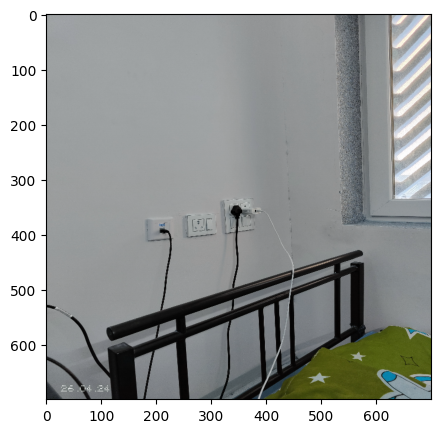

In [18]:
plt.figure(figsize=(10, 5))
plt.imshow(downsampled_image1, cmap='gray')

In [19]:
downsampled_image2 = cv2.resize(img2, (700, 700))
# cv2_imshow(downsampled_image2)

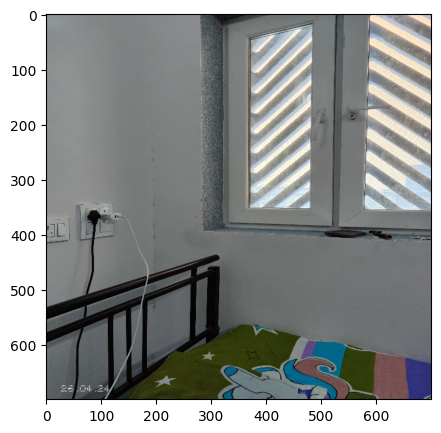

In [20]:
plt.figure(figsize=(10, 5))
plt.imshow(downsampled_image2, cmap='gray')

In [21]:
gray1 = cv2.cvtColor(downsampled_image1, cv2.COLOR_RGB2GRAY)
grays1 = list(pyramid_gaussian(gray1, downscale=DOWNSCALE, max_layer=N_LAYERS, multichannel=False))

<ipython-input-21-5c562c11c357>:2: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  grays1 = list(pyramid_gaussian(gray1, downscale=DOWNSCALE, max_layer=N_LAYERS, multichannel=False))


In [22]:
gray2 = cv2.cvtColor(downsampled_image2, cv2.COLOR_RGB2GRAY)
grays2 = list(pyramid_gaussian(gray2, downscale=DOWNSCALE, max_layer=N_LAYERS, multichannel=False))

<ipython-input-22-c89097b3df3e>:2: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  grays2 = list(pyramid_gaussian(gray2, downscale=DOWNSCALE, max_layer=N_LAYERS, multichannel=False))


In [23]:
features_img1 = Image.fromarray(np.copy(downsampled_image1))
features_img2 = Image.fromarray(np.copy(downsampled_image2))

In [24]:
scales = [DOWNSCALE**i for i in range(N_LAYERS)]
print('scales: ', scales, '\n')

scales:  [1, 2, 4, 8] 



In [75]:
keypoints1 = FAST(grays1[0])
keypoints2 = FAST(grays2[0])

In [76]:
d1 = BRIEF(grays1[0], keypoints1, mode='uniform', patch_size=8, n=512)
d2 = BRIEF(grays2[0], keypoints2, mode='uniform', patch_size=8, n=512)

In [77]:
matches = match(d1, d2, cross_check=True, distance_ratio=0.2)

pyramid layer:  0
scales[i]:  1
scale_coeff1:  (1.0, 1.0)
scale_coeff2:  (1.0, 1.0)
grays1[i] shape:  (700, 700)
grays2[i] shape:  (700, 700)
kp1:  363
kp2:  264


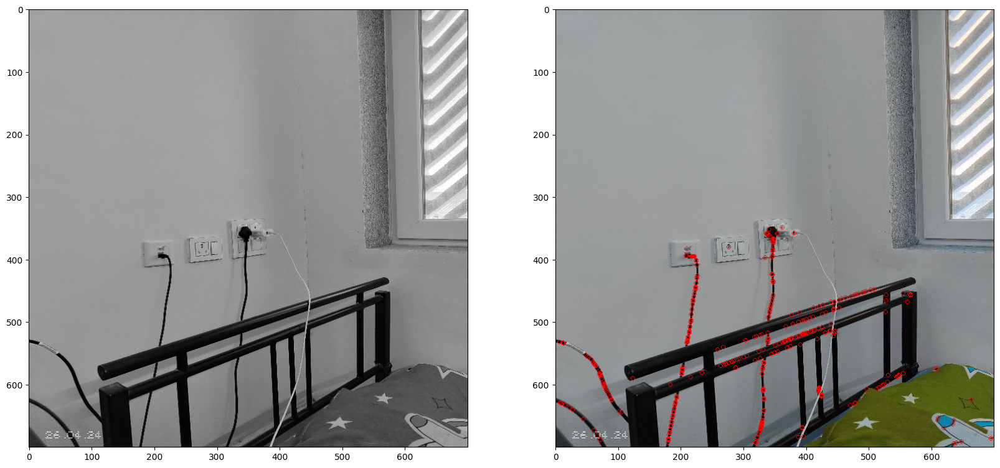

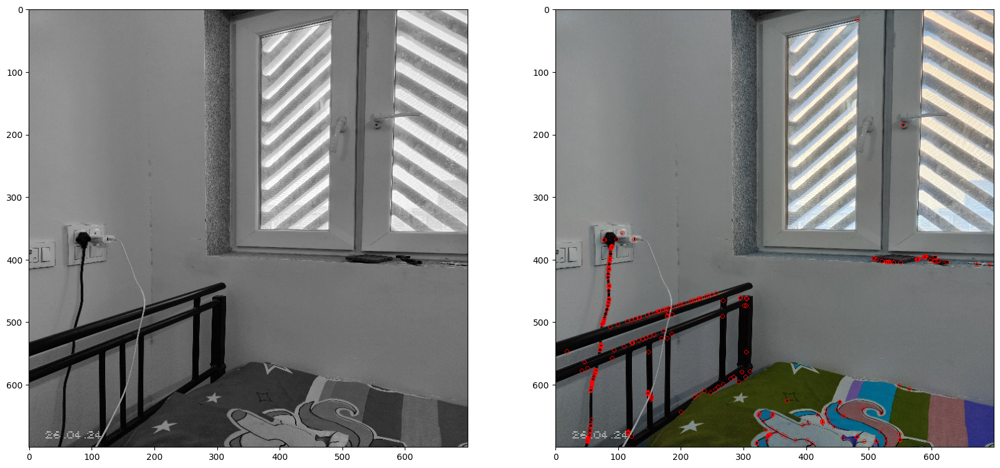

--------------------------------------------------
pyramid layer:  1
scales[i]:  2
scale_coeff1:  (2.0, 2.0)
scale_coeff2:  (2.0, 2.0)
grays1[i] shape:  (350, 350)
grays2[i] shape:  (350, 350)
kp1:  236
kp2:  163


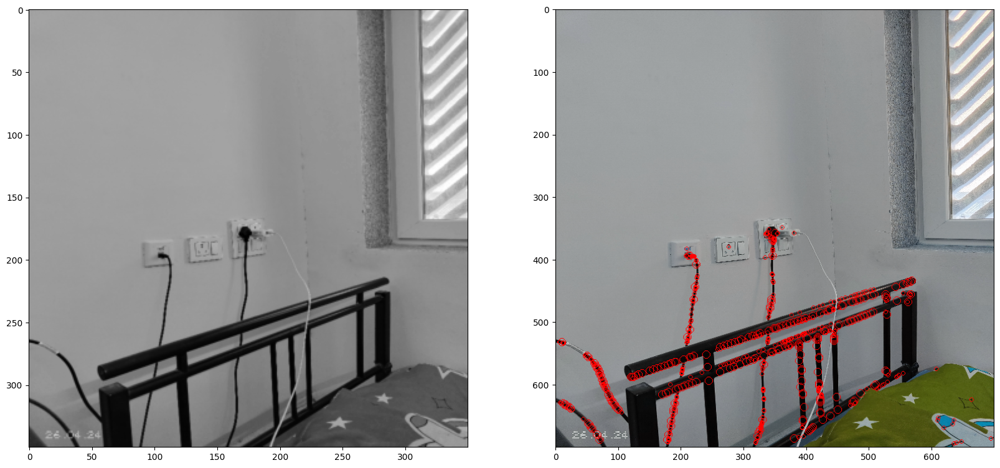

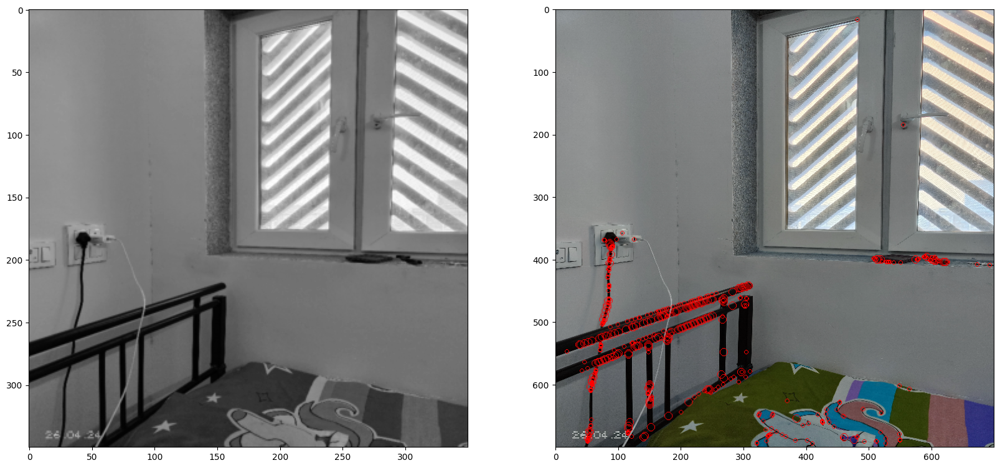

--------------------------------------------------
pyramid layer:  2
scales[i]:  4
scale_coeff1:  (4.0, 4.0)
scale_coeff2:  (4.0, 4.0)
grays1[i] shape:  (175, 175)
grays2[i] shape:  (175, 175)
kp1:  83
kp2:  57


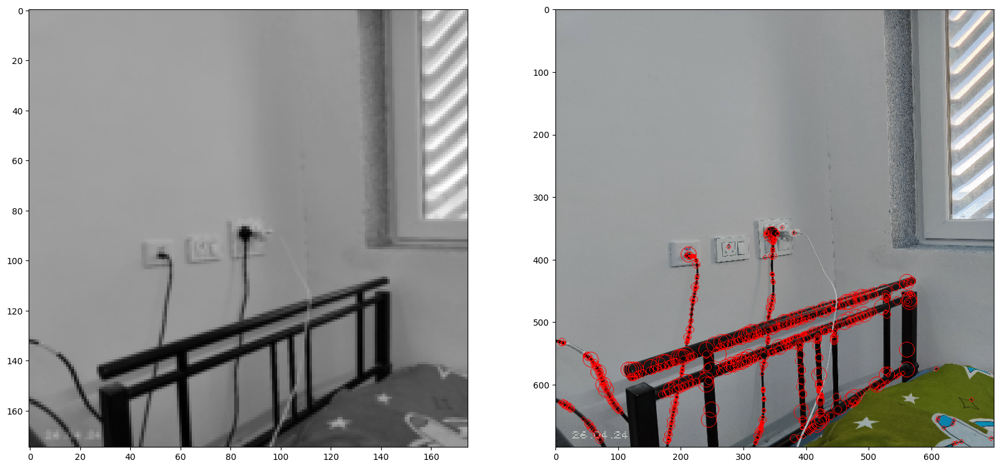

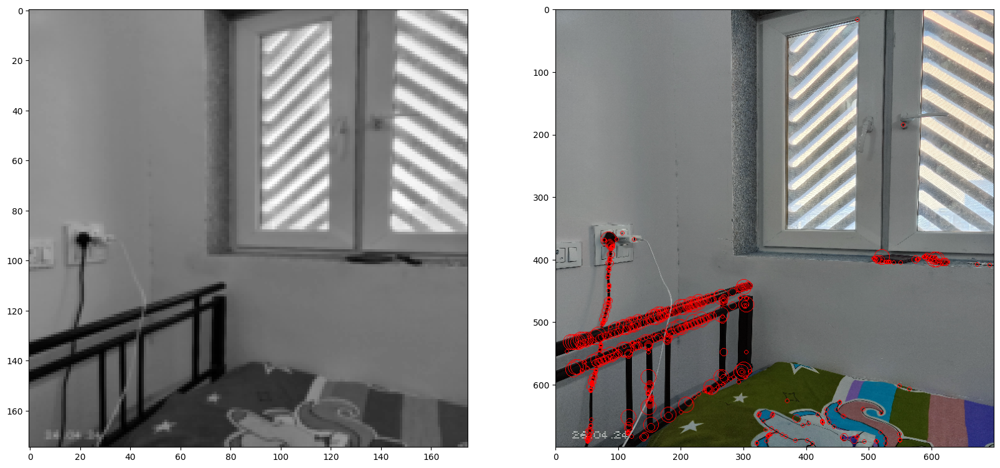

--------------------------------------------------
pyramid layer:  3
scales[i]:  8
scale_coeff1:  (7.954545454545454, 7.954545454545454)
scale_coeff2:  (7.954545454545454, 7.954545454545454)
grays1[i] shape:  (88, 88)
grays2[i] shape:  (88, 88)
kp1:  13
kp2:  7


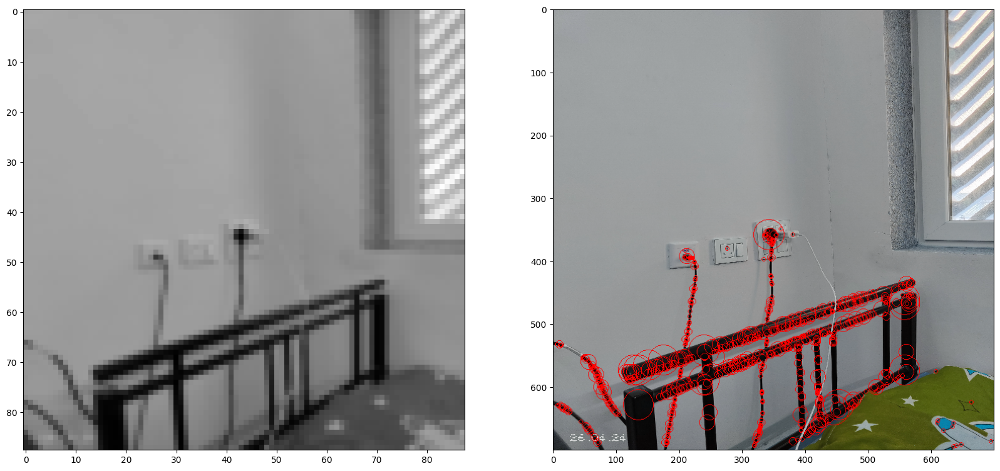

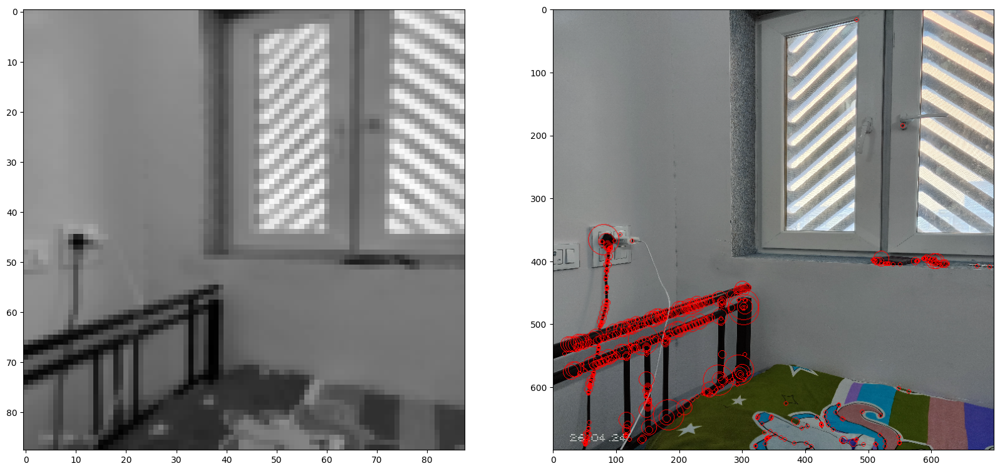

--------------------------------------------------


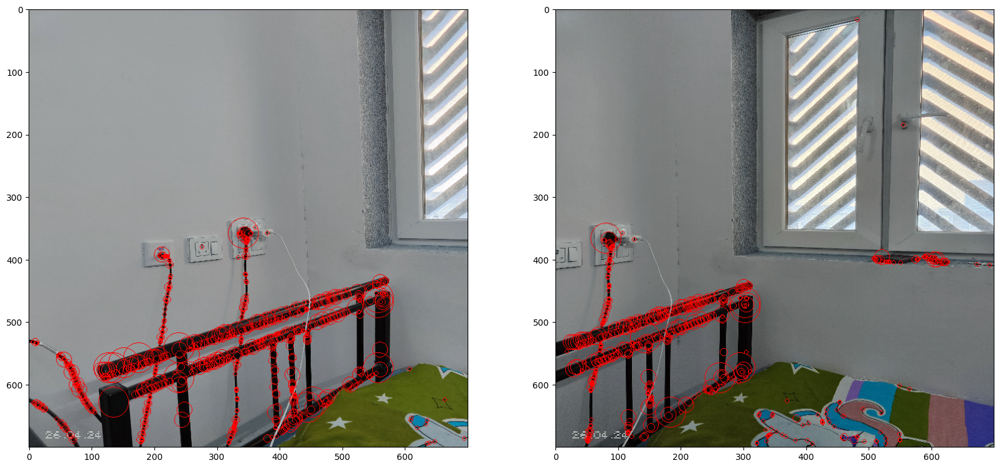

In [25]:
for i in range(N_LAYERS):
    print('pyramid layer: ', i)
    print('scales[i]: ', scales[i])
    scale_coeff1 = (gray1.shape[1] / grays1[i].shape[1], gray1.shape[0] / grays1[i].shape[0])
    scale_coeff2 = (gray2.shape[1] / grays2[i].shape[1], gray2.shape[0] / grays2[i].shape[0])

    print('scale_coeff1: ', scale_coeff1)
    print('scale_coeff2: ', scale_coeff2)

    print('grays1[i] shape: ', grays1[i].shape)
    print('grays2[i] shape: ', grays2[i].shape)

    scale_kp1 = FAST(grays1[i], N=10, threshold=0.75, nms_window=3, radius=5)
    scale_kp2 = FAST(grays2[i], N=10, threshold=0.75, nms_window=3, radius=5)

    print('kp1: ', len(scale_kp1))
    print('kp2: ', len(scale_kp2))

    for keypoint in scale_kp1:
#         features_img1 = cv2.circle(features_img1, tuple(np.round(keypoint*scale_coeff1).astype(np.int32)), int(3*scales[i]), (0,255,0), 1)
        x0 = np.round(keypoint*scale_coeff1)[0]-3*scales[i]
        y0 = np.round(keypoint*scale_coeff1)[1]-3*scales[i]
        x1 = np.round(keypoint*scale_coeff1)[0]+3*scales[i]
        y1 = np.round(keypoint*scale_coeff1)[1]+3*scales[i]
        draw1 = ImageDraw.Draw(features_img1)
        draw1.ellipse([x0,y0,x1,y1], outline='red', width=1)
    for keypoint in scale_kp2:
#         features_img2 = cv2.circle(features_img2, tuple(np.round(keypoint*scale_coeff2).astype(np.int32)), int(3*scales[i]), (0,255,0), 1)
        x0 = np.round(keypoint*scale_coeff2)[0]-3*scales[i]
        y0 = np.round(keypoint*scale_coeff2)[1]-3*scales[i]
        x1 = np.round(keypoint*scale_coeff2)[0]+3*scales[i]
        y1 = np.round(keypoint*scale_coeff2)[1]+3*scales[i]
        draw2 = ImageDraw.Draw(features_img2)
        draw2.ellipse([x0,y0,x1,y1], outline='red', width=1)
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(grays1[i], cmap='gray')
    plt.subplot(1,2,2)
    plt.imshow(features_img1)

    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(grays2[i], cmap='gray')
    plt.subplot(1,2,2)
    plt.imshow(features_img2)

#     orientations1, orientations2 = None, None
    orientations1 = corner_orientations(grays1[i], scale_kp1)
    orientations2 = corner_orientations(grays2[i], scale_kp2)

    if not (len(scale_kp1) == 0 or len(scale_kp2) == 1):
        # avoding errors when no keypoints are computed (happens with small scales - higher pyramid layers)
        kps1.append(np.round(scale_kp1*scale_coeff1).astype(np.int32))
        kps2.append(np.round(scale_kp2*scale_coeff2).astype(np.int32))

        d1 = BRIEF(grays1[i], scale_kp1, orientations=orientations1, mode='uniform', n=128)
        d2 = BRIEF(grays2[i], scale_kp2, orientations=orientations2, mode='uniform', n=128)
        ds1.append(d1)
        ds2.append(d2)

    plt.show()
    print('-'*50)


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(features_img1)
plt.subplot(1,2,2)
plt.imshow(features_img2)
plt.show()

total matches:  40


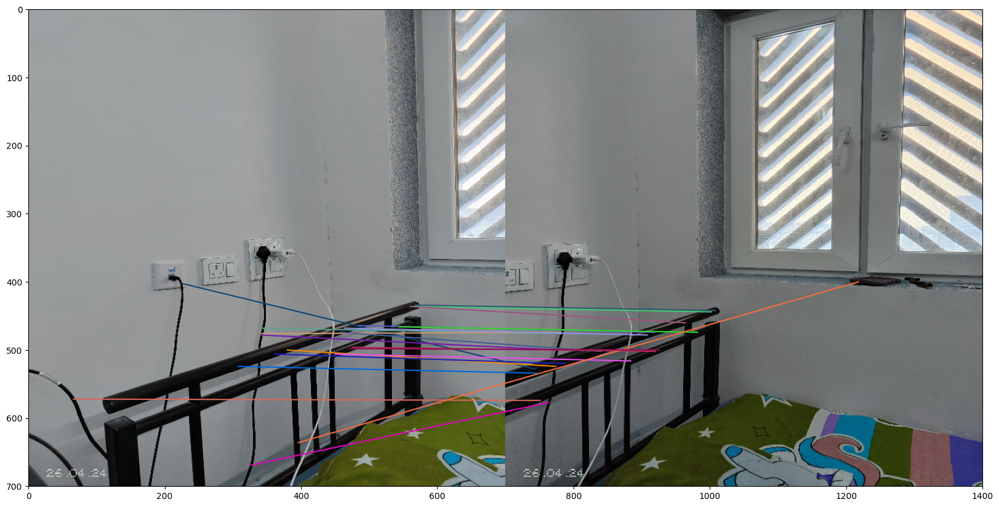

In [26]:
scale_kps1 = np.vstack(kps1)
scale_kps2 = np.vstack(kps2)

scale_ds1 = np.vstack(ds1)
scale_ds2 = np.vstack(ds2)

# Matching is done after computing all keypoints and descriptors to allow for
# the sorting of all descriptors computed on all scales
scale_ms = match(scale_ds1, scale_ds2, cross_check=True, max_distance=np.inf, distance_ratio=0.5)

print('total matches: ', len(scale_ms))

fig = plt.figure(figsize=(20.0, 30.0))
ax = fig.add_subplot(1,1,1)
plot_matches(ax, downsampled_image1, downsampled_image2, np.flip(scale_kps1, 1), np.flip(scale_kps2, 1), scale_ms[:20],
             alignment='horizontal', only_matches=True)

In [67]:
def blend_and_create_panorama(resized_dst_img, warped_src_img, dst_width, stitching_side, display_step=False):
        """
        Blends two images to create a panorama.

        Args:
        - resized_dst_img: Resized destination image
        - warped_src_img: Warped source image
        - dst_width: Width of the destination image
        - stitching_side: Side on which the images are being stitched ('left' or 'right')
        - display_step: Whether to display intermediate blending steps

        Returns:
        - panorama: Blended panorama image
        - left_side: Left side image (for display)
        - right_side: Right side image (for display)

        """
        cv2_imshow(resized_dst_img)
        cv2_imshow(warped_src_img)
        # plt.show()
        def create_blending_mask(height_input, width_input, barrier_input, smoothing_window_input, left_biased_input=True):
            # Function to create blending mask
            assert barrier_input < width_input
            mask_output = np.zeros((height_input, width_input))

            offset_value = int(smoothing_window_input / 2)
            left_range_output = slice(barrier_input - offset_value, barrier_input + offset_value + 1)
            right_range_output = slice(barrier_input + offset_value + 1, None) if not left_biased_input else slice(None, barrier_input - offset_value)

            if left_biased_input:
                mask_output[:, left_range_output] = np.tile(np.linspace(1, 0, 2 * offset_value).T, (height_input, 1))
                # mask_output[:, left_range_output] = np.tile(np.linspace(1, 0, 2 * offset_value + 1).T, (height_input, 1))
            else:
                mask_output[:, left_range_output] = np.tile(np.linspace(0, 1, 2 * offset_value).T, (height_input, 1))
                # mask_output[:, left_range_output] = np.tile(np.linspace(0, 1, 2 * offset_value + 1).T, (height_input, 1))

            mask_output[:, right_range_output] = 1

            return cv2.merge([mask_output, mask_output, mask_output])

        h, w, _ = resized_dst_img.shape
        smoothing_window_size = int(dst_width / 8)
        barrier_position = dst_width - int(smoothing_window_size / 2)
        # print(w, barrier_position, "sdf", resized_dst_img)
        blending_mask_left = create_blending_mask(h, w, barrier_position, smoothing_window_size, True)
        blending_mask_right = create_blending_mask(h, w, barrier_position, smoothing_window_size, False)
        print("df", blending_mask_right)

        if stitching_side == 'left':
            resized_dst_img, warped_src_img = cv2.flip(resized_dst_img, 1), cv2.flip(warped_src_img, 1)
            resized_dst_img, warped_src_img = resized_dst_img * blending_mask_left, warped_src_img * blending_mask_right
            panorama = cv2.flip(warped_src_img + resized_dst_img, 1)
            left_side, right_side = cv2.flip(warped_src_img, 1), cv2.flip(resized_dst_img, 1) if display_step else (None, None)
            print(left_side, right_side)
        else:
            resized_dst_img, warped_src_img = resized_dst_img * blending_mask_left, warped_src_img * blending_mask_right
            panorama = warped_src_img + resized_dst_img
            left_side, right_side = resized_dst_img, warped_src_img if display_step else (None, None)
            print(left_side, right_side)

        return panorama, warped_src_img + resized_dst_img if display_step else None, left_side, right_side

In [68]:
def image_stitching(image1, image2, keypoints1, keypoints2, matches):
    # Convert keypoints to numpy arrays
    keypoints1 = np.float32([keypoints1[m[0]] for m in matches]).reshape(-1, 1, 2)
    keypoints2 = np.float32([keypoints2[m[1]] for m in matches]).reshape(-1, 1, 2)
    print(keypoints1, keypoints2)

    # Estimate homography
    H, mask = cv2.findHomography(keypoints1, keypoints2, cv2.RANSAC, 5.0)
    matchesMask = mask.ravel().tolist()
    print("H", H)

    # # Warp image2 to align with image1
    # height, width = image1.shape[:2]
    # warped_image2 = cv2.warpPerspective(image2, H, (width + image2.shape[1], height))

    # # Blend the warped image with image1
    # stitched_image = np.zeros((height, width + image2.shape[1], 1), dtype=np.uint8)
    # stitched_image[:, :width] = image1
    # stitched_image = blend_images(stitched_image, warped_image2)

    height_src, width_src = image1.shape[:2]
    height_dst, width_dst = image2.shape[:2]
    print(height_src, width_src, 'a')
    print(height_dst, width_dst, 'b')

    # Extract corners of two images: top-left, bottom-left, bottom-right, top-right
    pts1 = np.float32([[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]).reshape(-1, 1, 2)
    print("pts", pts1, pts2)

    # Apply homography to corners of source_image
    pts1_transformed = cv2.perspectiveTransform(pts1, H)
    print("trans", pts1_transformed)
    corners = np.concatenate((pts1_transformed, pts2), axis=0)
    print("cor", corners)

    # Find max min of x,y coordinate
    [xmin, ymin] = np.int64(corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int64(corners.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]

    # Determine side for merging images
    if corners[0][0][0] < 0:
        side = 'left'
        width_panorama = width_dst + t[0]
    else:
        width_panorama = int(pts1_transformed[3][0][0])
        side = 'right'

    height_panorama = ymax - ymin

    # Translation
    H_translated = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
    warped_source_image = cv2.warpPerspective(image1, H_translated.dot(H), (width_panorama, height_panorama))
    print(warped_source_image.shape, width_panorama, height_panorama, side)

    # Generating size of resized_destination_image which has the same size as warped_source_image
    resized_destination_image = np.zeros((height_panorama, width_panorama, 3))
    # resized_destination_image[t[1]:height_src + t[1], t[0]:width_dst + t[0] if side == 'left' else width_dst] = image2
    resized_destination_image[t[1]:height_src + t[1], t[0]:width_dst + t[0] if side == 'left' else width_panorama] = image2[t[1]:height_dst + t[1], t[0]:width_dst + t[0] if side == 'left' else width_panorama]

    print(resized_destination_image.shape, resized_destination_image.shape, width_dst)

    # Blending panorama
    panorama, non_blend, left_side, right_side = blend_and_create_panorama(resized_destination_image, warped_source_image, width_panorama, side, True)

    # Cropping black region
    [xmin, ymin] = np.int32(corners.min(axis=0).ravel() - 0.5)
    print("min", [xmin, ymin])
    [xmax, ymax] = np.int32(corners.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    print("max", [xmax, ymax])
    print("t", t)

    # Determine if the warped image is merged to the left or right side of the destination image
    if corners[0][0][0] < 0:
        n = int(abs(-corners[1][0][0] + corners[0][0][0]))
        panorama = panorama[t[1]:height_dst + t[1], n:, :]
    else:
        if corners[2][0][0] < corners[3][0][0]:
            panorama = panorama[t[1]:height_dst + t[1], 0:int(corners[2][0][0]), :]
        else:
            panorama = panorama[t[1]:height_dst + t[1], 0:int(corners[3][0][0]), :]

    return panorama, non_blend, left_side, right_side, keypoints1, keypoints2
    return stitched_image

def blend_images(image1, image2):
    # Simple blending
    blend_width = 50
    blend_mask = np.zeros((image1.shape[0], blend_width, 3), dtype=np.uint8)
    for i in range(blend_width):
        alpha = i / blend_width
        blend_mask[:, i] = (1 - alpha) * image1[:, -blend_width + i] + alpha * image2[:, i]

    image1[:, -blend_width:] = blend_mask

    return image1

[[[361. 349.]]

 [[191. 628.]]

 [[332. 623.]]

 [[193. 619.]]

 [[523. 600.]]

 [[241. 574.]]

 [[278. 564.]]

 [[279. 537.]]

 [[291. 533.]]

 [[609. 657.]]

 [[  6. 532.]]

 [[387. 500.]]

 [[431. 485.]]

 [[342. 479.]]

 [[451. 478.]]

 [[561. 468.]]

 [[345. 466.]]

 [[564. 455.]]

 [[299. 401.]]

 [[439. 503.]]

 [[180. 689.]]] [[[106. 358.]]

 [[ 83. 473.]]

 [[ 72. 536.]]

 [[ 51. 690.]]

 [[281. 590.]]

 [[266. 474.]]

 [[122. 533.]]

 [[ 90. 522.]]

 [[168. 495.]]

 [[431. 647.]]

 [[458. 671.]]

 [[ 42. 578.]]

 [[213. 508.]]

 [[ 58. 597.]]

 [[186. 488.]]

 [[301. 474.]]

 [[ 83. 474.]]

 [[304. 462.]]

 [[ 29. 413.]]

 [[172. 514.]]

 [[ 84. 470.]]]
H [[-5.96674049e-02 -1.21024941e-01  8.37443115e+01]
 [-3.10102667e-01 -6.99519093e-01  4.71573164e+02]
 [-6.54563642e-04 -1.48631517e-03  1.00000000e+00]]
700 700 a
700 700 b
pts [[[  0.   0.]]

 [[  0. 700.]]

 [[700. 700.]]

 [[700.   0.]]] [[[  0.   0.]]

 [[  0. 700.]]

 [[700. 700.]]

 [[700.   0.]]]
trans [[[ 83.74431  

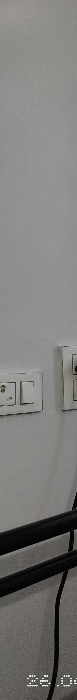

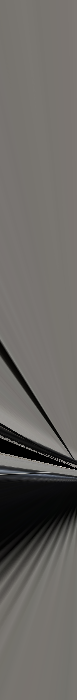

df [[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.71428571 0.71428571 0.71428571]
  [0.85714286 0.85714286 0.85714286]
  [1.         1.         1.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.71428571 0.71428571 0.71428571]
  [0.85714286 0.85714286 0.85714286]
  [1.         1.         1.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.71428571 0.71428571 0.71428571]
  [0.85714286 0.85714286 0.85714286]
  [1.         1.         1.        ]]

 ...

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.71428571 0.71428571 0.71428571]
  [0.85714286 0.85714286 0.85714286]
  [1.         1.         1.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.       

In [78]:
pano,non_blend,left_side,right_side, k1, k2 = image_stitching(downsampled_image1, downsampled_image2, keypoints1, keypoints2, matches)

In [70]:
def convert_result(img):
    img_normalized = np.array(img, dtype=float) / 255
    img_rgb = img_normalized[:, :, ::-1]
    return img_rgb

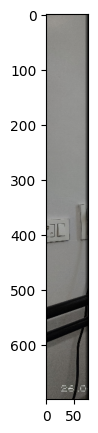

In [80]:
plt.figure(figsize=(5,5))
plt.imshow(convert_result(left_side))

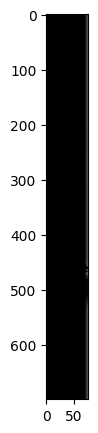

In [81]:
plt.figure(figsize=(5,5))
plt.imshow(convert_result(right_side))

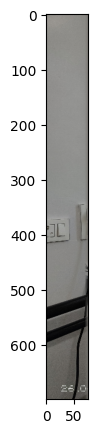

In [82]:
plt.figure(figsize=(5,5))
plt.imshow(convert_result(pano))

In [27]:
def find_and_describe_features(image):
  """
  Find keypoints using Harris corners and describe them using ORB descriptors.
  """
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  # Detect Harris corners
  corners = FAST(gray_image, N=10, threshold=0.75, nms_window=3, radius=5)

  # Determine threshold for corners
  keypoints = [cv2.KeyPoint(float(x), float(y), 5) for y, x in corners]  # setting size to 5, which is more typical
  if not keypoints:
      return [], np.array([])

  # Create ORB descriptor to describe keypoints
  orb = cv2.ORB_create()
  keypoints, features = orb.compute(gray_image, keypoints)
  features = np.float32(features)
  img_with_keypoints = cv2.drawKeypoints(image, keypoints, None, color=(0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  cv2_imshow( img_with_keypoints)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

  return keypoints, features

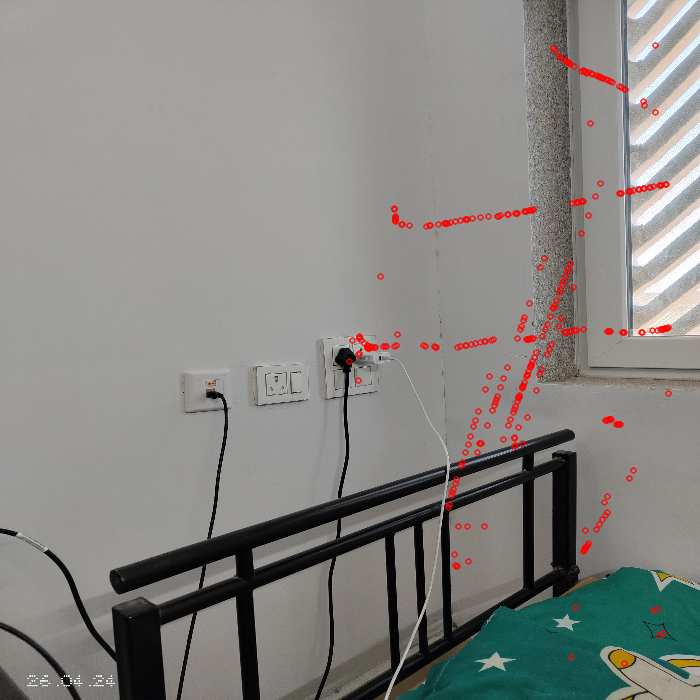

In [28]:
keyP1, desc1 = find_and_describe_features(downsampled_image1)

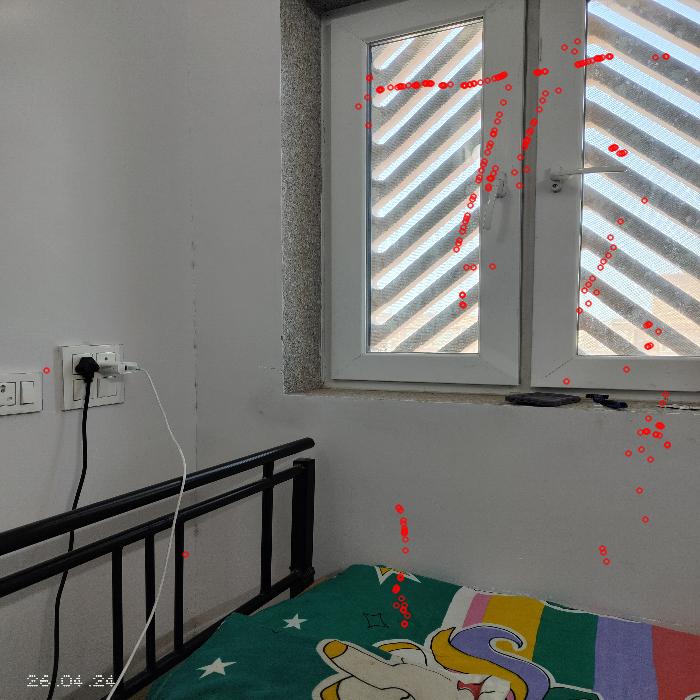

In [29]:
keyP2, desc2 = find_and_describe_features(downsampled_image2)

In [ ]:
keyP2

In [30]:
def match_features(featuresA, featuresB, ratio=0.75):
  # Function to match features between two sets of features
  featureMatcher = cv2.DescriptorMatcher_create("BruteForce")

  matches = featureMatcher.knnMatch(featuresA, featuresB, k=2)
  good = [m for m, n in matches if m.distance < ratio * n.distance]

  if len(good) > 4:
      return good
  else:
      raise Exception("Not enough matches")

In [31]:
good_features = match_features(desc1, desc2)

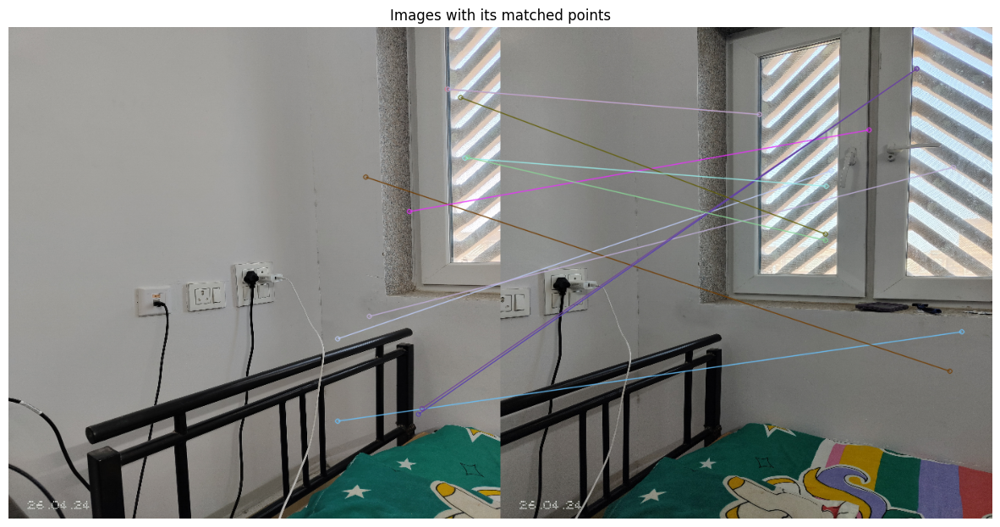

In [40]:
def plot_matches(image1, keypoints1, image2, keypoints2, matches):
    """Plot matches between keypoints in two images"""
    # Draw matches between the two images
    matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Convert BGR image to RGB for display
    matched_image_rgb = cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB)

    # Display the matched image
    plt.figure(figsize=(15, 15))
    plt.imshow(matched_image_rgb)
    plt.title('Images with its matched points')
    plt.axis('off')
    plt.show()


plot_matches(downsampled_image1, keyP1, downsampled_image2, keyP2, good_features)

In [63]:
class ImageStitcher:
    def blend_and_create_panorama(resized_dst_img, warped_src_img, dst_width, stitching_side, display_step=False):
        """
        Blends two images to create a panorama.

        Args:
        - resized_dst_img: Resized destination image
        - warped_src_img: Warped source image
        - dst_width: Width of the destination image
        - stitching_side: Side on which the images are being stitched ('left' or 'right')
        - display_step: Whether to display intermediate blending steps

        Returns:
        - panorama: Blended panorama image
        - left_side: Left side image (for display)
        - right_side: Right side image (for display)
        """
        def create_blending_mask(height_input, width_input, barrier_input, smoothing_window_input, left_biased_input=True):
            # Function to create blending mask
            assert barrier_input < width_input
            mask_output = np.zeros((height_input, width_input))

            offset_value = int(smoothing_window_input / 2)
            left_range_output = slice(barrier_input - offset_value, barrier_input + offset_value + 1)
            right_range_output = slice(barrier_input + offset_value + 1, None) if not left_biased_input else slice(None, barrier_input - offset_value)

            if left_biased_input:
                mask_output[:, left_range_output] = np.tile(np.linspace(1, 0, 2 * offset_value + 1).T, (height_input, 1))
            else:
                mask_output[:, left_range_output] = np.tile(np.linspace(0, 1, 2 * offset_value + 1).T, (height_input, 1))

            mask_output[:, right_range_output] = 1

            return cv2.merge([mask_output, mask_output, mask_output])

        h, w, _ = resized_dst_img.shape
        smoothing_window_size = int(dst_width / 8)
        barrier_position = dst_width - int(smoothing_window_size / 2)
        blending_mask_left = create_blending_mask(h, w, barrier_position, smoothing_window_size, True)
        blending_mask_right = create_blending_mask(h, w, barrier_position, smoothing_window_size, False)

        if stitching_side == 'left':
            resized_dst_img, warped_src_img = cv2.flip(resized_dst_img, 1), cv2.flip(warped_src_img, 1)
            resized_dst_img, warped_src_img = resized_dst_img * blending_mask_left, warped_src_img * blending_mask_right
            panorama = cv2.flip(warped_src_img + resized_dst_img, 1)
            left_side, right_side = cv2.flip(warped_src_img, 1), cv2.flip(resized_dst_img, 1) if display_step else (None, None)
        else:
            resized_dst_img, warped_src_img = resized_dst_img * blending_mask_left, warped_src_img * blending_mask_right
            panorama = warped_src_img + resized_dst_img
            left_side, right_side = resized_dst_img, warped_src_img if display_step else (None, None)

        return panorama, warped_src_img + resized_dst_img if display_step else None, left_side, right_side

In [65]:
def image_stitching(source_image, destination_image, src_keypoints, dst_keypoints, good_matches):
  src_points = np.float32([src_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  dst_points = np.float32([dst_keypoints[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

  # Find homography matrix using RANSAC
  H, mask = cv2.findHomography(src_points, dst_points, cv2.RANSAC, 5.0)

  # Generate mask indicating the matched keypoints
  matchesMask = mask.ravel().tolist()
  height_src, width_src = source_image.shape[:2]
  height_dst, width_dst = destination_image.shape[:2]

  # Extract corners of two images: top-left, bottom-left, bottom-right, top-right
  pts1 = np.float32([[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]).reshape(-1, 1, 2)
  pts2 = np.float32([[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]).reshape(-1, 1, 2)

  # Apply homography to corners of source_image
  pts1_transformed = cv2.perspectiveTransform(pts1, H)
  corners = np.concatenate((pts1_transformed, pts2), axis=0)

  # Find max min of x,y coordinate
  [xmin, ymin] = np.int64(corners.min(axis=0).ravel() - 0.5)
  [xmax, ymax] = np.int64(corners.max(axis=0).ravel() + 0.5)
  t = [-xmin, -ymin]

  # Determine side for merging images
  if corners[0][0][0] < 0:
      side = 'left'
      width_panorama = width_dst + t[0]
  else:
      width_panorama = int(pts1_transformed[3][0][0])
      side = 'right'

  height_panorama = ymax - ymin

  # Translation
  H_translated = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
  warped_source_image = cv2.warpPerspective(source_image, H_translated.dot(H), (width_panorama, height_panorama))

  # Generating size of resized_destination_image which has the same size as warped_source_image
  resized_destination_image = np.zeros((height_panorama, width_panorama, 3))
  resized_destination_image[t[1]:height_src + t[1], t[0]:width_dst + t[0] if side == 'left' else width_dst] = destination_image[t[1]:height_src + t[1], t[0]:width_dst + t[0] if side == 'left' else width_dst]

  # Blending panorama
  panorama, non_blend, left_side, right_side = ImageStitcher.blend_and_create_panorama(resized_destination_image, warped_source_image, width_dst, side, True)


  # Cropping black region
  [xmin, ymin] = np.int32(corners.min(axis=0).ravel() - 0.5)
  [xmax, ymax] = np.int32(corners.max(axis=0).ravel() + 0.5)
  t = [-xmin, -ymin]

  # Determine if the warped image is merged to the left or right side of the destination image
  if corners[0][0][0] < 0:
      n = int(abs(-corners[1][0][0] + corners[0][0][0]))
      panorama = panorama[t[1]:height_dst + t[1], n:, :]
  else:
      if corners[2][0][0] < corners[3][0][0]:
          panorama = panorama[t[1]:height_dst + t[1], 0:int(corners[2][0][0]), :]
      else:
          panorama = panorama[t[1]:height_dst + t[1], 0:int(corners[3][0][0]), :]

  return panorama, non_blend, left_side, right_side, src_keypoints, dst_keypoints, good_matches

In [66]:
pano, non_blend, left_side, right_side, k1, k2 = image_stitching(downsampled_image1, downsampled_image2, keyP1, keyP2, good_features)

ValueError: could not broadcast input array from shape (673,700,3) into shape (700,621,3)

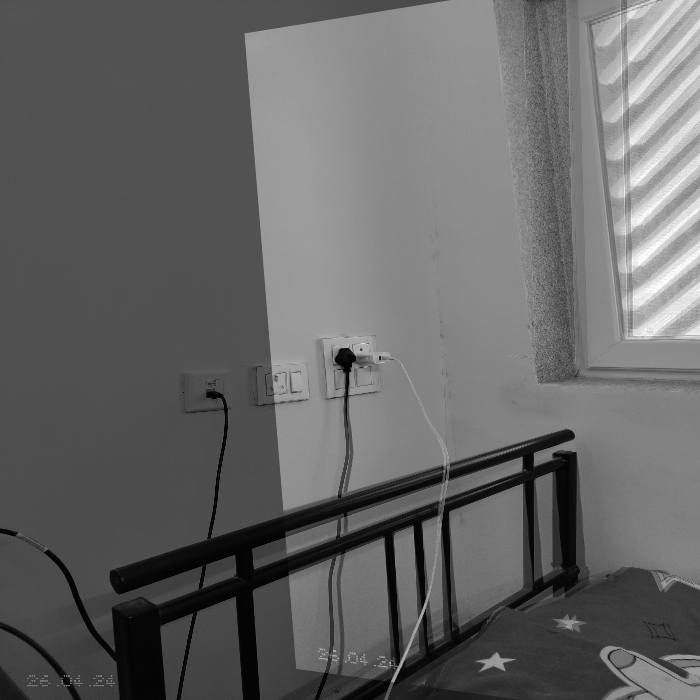

In [83]:
image1 = cv2.imread("/content/1.jpg", cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread("/content/2.jpg", cv2.IMREAD_GRAYSCALE)

image1 = cv2.resize(image1, (700, 700))
image2 = cv2.resize(image2, (700, 700))

orb = cv2.ORB_create()

keypoints1, descriptors1 = orb.detectAndCompute(image1, None)
keypoints2, descriptors2 = orb.detectAndCompute(image2, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

matches = bf.match(descriptors1, descriptors2)

matches = sorted(matches, key=lambda x: x.distance)

matched_keypoints1 = np.float32([keypoints1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
matched_keypoints2 = np.float32([keypoints2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

H, _ = cv2.findHomography(matched_keypoints2, matched_keypoints1, cv2.RANSAC)

warped_image2 = cv2.warpPerspective(image2, H, (image1.shape[1], image1.shape[0]))

blended_image = cv2.addWeighted(image1, 0.5, warped_image2, 0.5, 1)
# matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matched image
cv2_imshow(blended_image)
cv2.waitKey(0)
cv2.destroyAllWindows()
